In [1]:
# Cella 0 — environment & headless MP4 sanity check
import os, sys, platform
print("Python:", sys.version.split()[0], "|", platform.system())

import pyvista as pv
print("PyVista:", pv.__version__)

# Headless: se non c'è DISPLAY (sessione remota/desktop senza X), avvia framebuffer virtuale
if platform.system() == "Linux" and not os.environ.get("DISPLAY"):
    try:
        pv.start_xvfb()
        print("Avviato Xvfb (display virtuale).")
    except Exception as e:
        print("Xvfb non disponibile:", e, "\n-> potrebbe funzionare comunque se c'è un display attaccato.")

# Backend ffmpeg per scrivere il filmato
try:
    import imageio_ffmpeg
    print("imageio-ffmpeg:", imageio_ffmpeg.get_ffmpeg_version())
except Exception as e:
    print("imageio-ffmpeg MANCANTE ->", e, "\n-> installa con: pip install imageio-ffmpeg")

# Test minimo: render off-screen + scrittura di pochi frame
test_path = "test_render.mp4"
pl = pv.Plotter(off_screen=True, window_size=(640, 480))
pl.set_background("black")
pl.add_mesh(pv.Sphere(), color="orange", smooth_shading=True)
pl.open_movie(test_path, framerate=24, quality=8)
for i in range(12):
    pl.camera.zoom(1.03)   # piccolo movimento per avere frame diversi
    pl.write_frame()
pl.close()

ok = os.path.exists(test_path) and os.path.getsize(test_path) > 0
print(f"\nMP4 scritto: {ok} | dimensione: {os.path.getsize(test_path) if ok else 0} bytes")
print("->", os.path.abspath(test_path))

Python: 3.12.12 | Linux


/home/matteo.doria/Desktop/ASLCD/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


PyVista: 0.48.4
Xvfb non disponibile: module 'pyvista' has no attribute 'start_xvfb' 
-> potrebbe funzionare comunque se c'è un display attaccato.
imageio-ffmpeg: 7.0.2-static


2026-06-17 21:34:38.319 (   1.206s) [    7F5B1F43F2C0]vtkXOpenGLRenderWindow.:1460  WARN| bad X server connection. DISPLAY=



MP4 scritto: True | dimensione: 34947 bytes
-> /home/matteo.doria/Desktop/ASLCD/notebooks/test_render.mp4


G caricato | cellule totali: 8065561
Sample 47: 50988 cellule, 349878 edge diretti

Finestra hero -> N=9529 cellule, M=39284 edge non orientati
  c0 B           : 464
  c1 Endothelial : 1405
  c2 Fibroblasts : 6201
  c3 Myeloid     : 1328
  c4 Normal-epi  : 1
  c5 SMC         : 11
  c6 T           : 116
  c7 Tumor       : 3


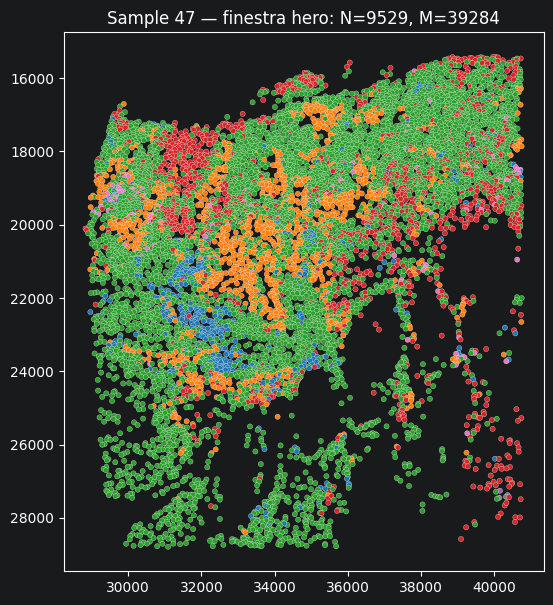

In [2]:
# Cella 1 — carico G, ritaglio la finestra-hero del sample 47, ricostruisco gli edge
import sys, os
import numpy as np

# --- percorsi robusti (root oppure notebooks/) ---
if   os.path.isdir("src"):    ROOT = "."
elif os.path.isdir("../src"): ROOT = ".."
else: raise RuntimeError("Non trovo 'src/'. Lancia da root o da notebooks/.")
SRC, CACHE = os.path.join(ROOT, "src"), os.path.join(ROOT, "cache")
if SRC not in sys.path: sys.path.insert(0, SRC)

import data_io, graph_construction

G = data_io.load_global(CACHE)
print("G caricato | cellule totali:", G.positions.shape[0])

# --- sottografo sample 47 ---
SAMPLE = 47
sg    = graph_construction.build_for_sample(SAMPLE, global_arrays=G)
gidx  = sg.global_idxs
pos_s = np.asarray(G.positions[gidx], dtype=np.float64)   # (n_s,2) pixel-space livello 0
ct_s  = np.asarray(G.cell_type[gidx]).astype(int)
ei    = np.asarray(sg.edge_index)                         # (2,E) indici locali al sample
print(f"Sample {SAMPLE}: {pos_s.shape[0]} cellule, {ei.shape[1]} edge diretti")

# --- finestra hero: centro fisso, lato = 0.22 * estensione ---
CENTER, FRAC = np.array([34700.0, 22104.0]), 0.22
half  = FRAC * (pos_s.max(0) - pos_s.min(0)) / 2.0
lo,hi = CENTER - half, CENTER + half
inwin = (pos_s[:,0]>=lo[0])&(pos_s[:,0]<=hi[0])&(pos_s[:,1]>=lo[1])&(pos_s[:,1]<=hi[1])

sel   = np.where(inwin)[0]
remap = -np.ones(pos_s.shape[0], np.int64); remap[sel] = np.arange(sel.size)
emask = inwin[ei[0]] & inwin[ei[1]]
edges = remap[ei[:, emask]]
und   = np.unique(np.sort(edges, axis=0), axis=1)         # edge non orientati, deduplicati

pos = pos_s[sel]            # (N,2)
ct  = ct_s[sel]            # (N,)
N, M = pos.shape[0], und.shape[1]
print(f"\nFinestra hero -> N={N} cellule, M={M} edge non orientati")

# --- colori/nomi classi (tab10[:8]) + distribuzione ---
COLORS = ["#1F77B4","#FF7F0E","#2CA02C","#D62728","#9467BD","#8C564B","#E377C2","#7F7F7F"]
NAMES  = ["B","Endothelial","Fibroblasts","Myeloid","Normal-epi","SMC","T","Tumor"]
for k in range(8):
    print(f"  c{k} {NAMES[k]:<12}: {(ct==k).sum()}")

# --- scatter 2D di verifica ---
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
fig, ax = plt.subplots(figsize=(7,7))
ax.add_collection(LineCollection(pos[und.T], colors="0.6", linewidths=0.3, alpha=0.5, zorder=1))
ax.scatter(pos[:,0], pos[:,1], c=[COLORS[c] for c in ct], s=14, zorder=2,
           edgecolors="white", linewidths=0.2)
ax.set_aspect("equal"); ax.invert_yaxis()
ax.set_title(f"Sample {SAMPLE} — finestra hero: N={N}, M={M}")
plt.show()

Sotto-finestra: centro=(32282,20370), lato=2200px -> N=583, entropia tipi=1.33
Grafo 3D -> N=583 nodi, M=2479 edge
  c0 B           : 56
  c1 Endothelial : 164
  c2 Fibroblasts : 246
  c3 Myeloid     : 108
  c5 SMC         : 1
  c6 T           : 8


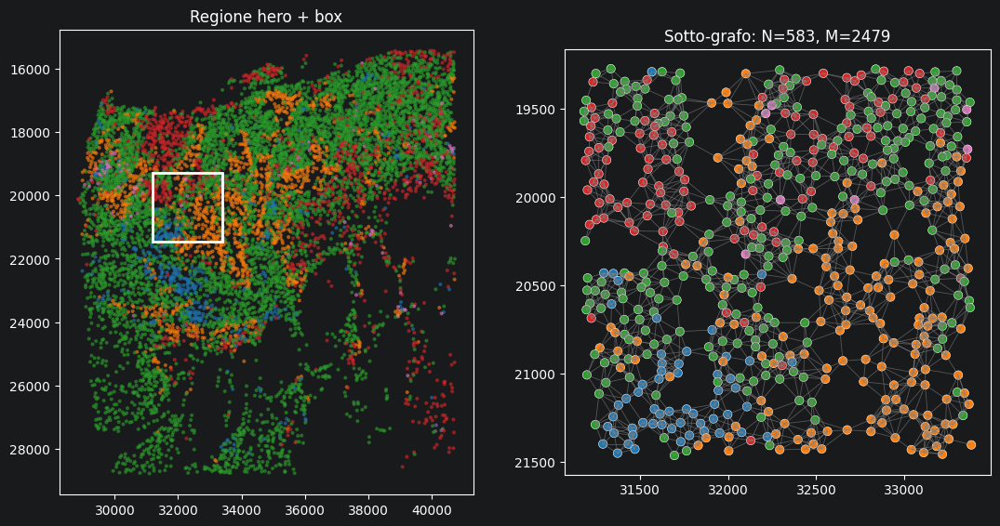

In [3]:
# Cella 2 — sotto-finestra densa & diversificata -> il grafo 3D (P, C, E)
TARGET_LO, TARGET_HI = 350, 650
MANUAL_CENTER = None          # es. (31500, 19500) per forzare a mano; None = auto

def win_mask(cx, cy, side):
    h = side/2
    return (pos[:,0]>=cx-h)&(pos[:,0]<cx+h)&(pos[:,1]>=cy-h)&(pos[:,1]<cy+h)

def diversity(mask):
    n = int(mask.sum())
    if n == 0: return 0.0
    p = np.bincount(ct[mask], minlength=8)/n; p = p[p>0]
    return float(-(p*np.log(p)).sum())

if MANUAL_CENTER is None:
    best = None
    for side in (2200., 2700., 3200., 3700.):
        xs = np.linspace(pos[:,0].min()+side/2, pos[:,0].max()-side/2, 30)
        ys = np.linspace(pos[:,1].min()+side/2, pos[:,1].max()-side/2, 30)
        for cx in xs:
            for cy in ys:
                n = int(win_mask(cx,cy,side).sum())
                if TARGET_LO <= n <= TARGET_HI:
                    H = diversity(win_mask(cx,cy,side))
                    if best is None or H > best[0]:
                        best = (H, cx, cy, side, n)
    assert best is not None, "Nessuna finestra nel range: allarga TARGET o i lati."
    H, CX, CY, SIDE, n = best
else:
    CX, CY = MANUAL_CENTER; SIDE = 2700.
    n, H = int(win_mask(CX,CY,SIDE).sum()), diversity(win_mask(CX,CY,SIDE))

print(f"Sotto-finestra: centro=({CX:.0f},{CY:.0f}), lato={SIDE:.0f}px -> N={n}, entropia tipi={H:.2f}")

# --- estraggo il sotto-grafo (riindicizzo da pos/ct/und) ---
m    = win_mask(CX,CY,SIDE)
ssel = np.where(m)[0]
rmap = -np.ones(pos.shape[0], np.int64); rmap[ssel] = np.arange(ssel.size)
em   = m[und[0]] & m[und[1]]
E    = rmap[und[:, em]]                 # (2, Msub)  edge non orientati, indici 0..Nsub-1
P    = pos[ssel].astype(np.float64)     # (Nsub, 2)
C    = ct[ssel]                         # (Nsub,)
print(f"Grafo 3D -> N={P.shape[0]} nodi, M={E.shape[1]} edge")
for k in range(8):
    if (C==k).sum(): print(f"  c{k} {NAMES[k]:<12}: {(C==k).sum()}")

# --- verifica: box sulla regione + zoom sul sotto-grafo ---
fig,(a1,a2)=plt.subplots(1,2,figsize=(13,6.5))
a1.scatter(pos[:,0],pos[:,1],c=[COLORS[c] for c in ct],s=4,alpha=0.5)
a1.add_patch(plt.Rectangle((CX-SIDE/2,CY-SIDE/2),SIDE,SIDE,fill=False,ec="white",lw=2))
a1.set_aspect("equal"); a1.invert_yaxis(); a1.set_title("Regione hero + box")
a2.add_collection(LineCollection(P[E.T],colors="0.5",lw=0.6,alpha=0.6))
a2.scatter(P[:,0],P[:,1],c=[COLORS[c] for c in C],s=45,edgecolors="white",lw=0.4)
a2.set_aspect("equal"); a2.invert_yaxis(); a2.set_title(f"Sotto-grafo: N={P.shape[0]}, M={E.shape[1]}")
plt.show()

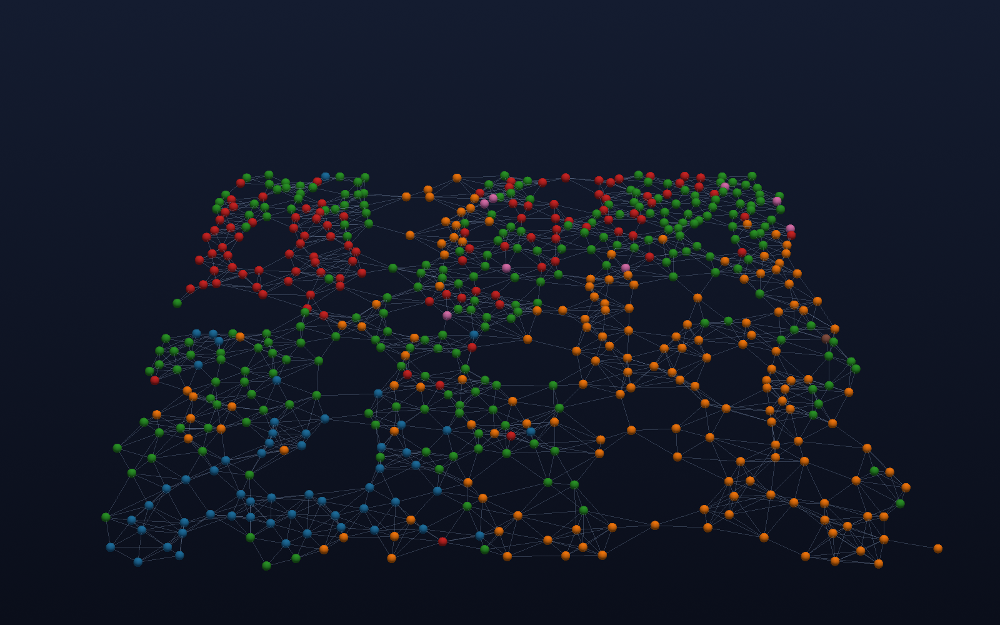

In [4]:
# Cella 3 — scena 3D statica: nodi-sfere + archi a z=0, un frame di verifica
import numpy as np, pyvista as pv
import matplotlib.colors as mcolors

# --- normalizzo: centro, y-up, scala ~[-5,5] (riuso XY nell'animazione) ---
Q = P - P.mean(0)
Q[:,1] *= -1.0                                  # pixel y-giù -> y-su
Q *= 5.0 / np.abs(Q).max()
XY   = Q.copy()
pts0 = np.hstack([XY, np.zeros((P.shape[0],1))]).astype(np.float64)   # (N,3) su z=0

# --- RGB per-nodo (tab10 esatti) ---
rgb = (np.array([mcolors.to_rgb(COLORS[c]) for c in C])*255).astype(np.uint8)

# --- mesh unica: punti (sfere) + linee (archi), così gli archi seguono i nodi ---
lines = np.column_stack([np.full(E.shape[1],2,np.int64), E[0], E[1]]).ravel()
mesh  = pv.PolyData(pts0, lines=lines)
mesh["rgb"] = rgb

# --- plotter off-screen, sfondo scuro gradiente "moderno" ---
pl = pv.Plotter(off_screen=True, window_size=(1600,1000))
pl.set_background("#0a0e1a", top="#141c30")
pl.add_mesh(mesh, style="wireframe", color="#8fa6c8", line_width=1.0, opacity=0.28)
pl.add_mesh(mesh, style="points", render_points_as_spheres=True, point_size=15,
            scalars="rgb", rgb=True, smooth_shading=True)

# --- camera leggermente obliqua: verifico sfericità nodi + archi ---
pl.camera_position = [(0, -14, 9), (0, 0, 0), (0, 0, 1)]   # (pos, focal, up)

pl.screenshot("hero3d_static.png")
pl.close()

from IPython.display import Image as IPyImage
display(IPyImage("hero3d_static.png"))

In [5]:
# Cella 4 — betweenness (B) -> relief lift-off + orbita | MP4 di PROVA (basso res)
import networkx as nx
import scipy.sparse as sp

# --- grafo + betweenness ---
g = nx.Graph(); g.add_nodes_from(range(P.shape[0])); g.add_edges_from(E.T.tolist())
bc = nx.betweenness_centrality(g, normalized=True)
bc = np.array([bc[i] for i in range(P.shape[0])]); bc /= bc.max()
print(f"betweenness: max=1.000, mediana={np.median(bc):.4f}, nodi>0.2: {(bc>0.2).sum()}")

# --- campo d'altezza: smoothing sul grafo -> creste continue (lo scheletro) ---
SMOOTH_ITERS = 2
A = sp.coo_matrix((np.ones(E.shape[1]*2), (np.r_[E[0],E[1]], np.r_[E[1],E[0]])),
                  shape=(P.shape[0],)*2).tocsr()
deg = np.asarray(A.sum(1)).ravel(); deg[deg==0] = 1
zf = bc.copy()
for _ in range(SMOOTH_ITERS):
    zf = 0.5*zf + 0.5*(A @ zf)/deg
zf = (zf - zf.min())/(zf.max()-zf.min()+1e-9)
zf = zf**0.7                                  # contrasto morbido

# --- parametri scena (knob da tarare) ---
Z_MAX, BASE_LIFT = 3.2, 1.0
relief = zf * Z_MAX
zfull  = BASE_LIFT + relief

# --- helper ease + camera orbitale ---
def smooth(t): t=np.clip(t,0,1); return t*t*(3-2*t)
def cam(az, elev, r, fz):
    a,e = np.radians(az), np.radians(elev)
    return [(r*np.cos(e)*np.cos(a), r*np.cos(e)*np.sin(a), fz+r*np.sin(e)), (0,0,fz), (0,0,1)]

# --- timeline PROVA ---
FPS, F_MORPH, F_ORBIT = 24, 48, 72            # ~2s lift + ~3s orbita
mesh.points = pts0.copy()
fz_top = zfull.mean()*0.5

pl = pv.Plotter(off_screen=True, window_size=(960,600))
pl.set_background("#0a0e1a", top="#141c30")
pl.add_mesh(mesh, style="wireframe", color="#8fa6c8", line_width=1.0, opacity=0.28)
pl.add_mesh(mesh, style="points", render_points_as_spheres=True, point_size=12,
            scalars="rgb", rgb=True, smooth_shading=True)
pl.open_movie("hero3d_test.mp4", framerate=FPS, quality=7)

for f in range(F_MORPH):                       # lift-off
    t = smooth(f/(F_MORPH-1))
    mesh.points = np.hstack([XY, (t*zfull)[:,None]])
    pl.camera_position = cam(10*t, 18+17*t, 15, fz_top*t)
    pl.write_frame()

mesh.points = np.hstack([XY, zfull[:,None]])
for f in range(F_ORBIT):                       # orbita dolce
    az = 10 + 110*(f/(F_ORBIT-1))
    pl.camera_position = cam(az, 35, 15, fz_top)
    pl.write_frame()

pl.close(); print("Scritto hero3d_test.mp4")
from IPython.display import Video
# Video("hero3d_test.mp4", embed=True, width=720)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (960, 600) to (960, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


betweenness: max=1.000, mediana=0.0764, nodi>0.2: 123
Scritto hero3d_test.mp4


In [6]:
# Cella 4A — morph 2D->spring-layout 3D (A) | MP4 di PROVA
import networkx as nx
from scipy.linalg import orthogonal_procrustes

g = nx.Graph(); g.add_nodes_from(range(P.shape[0])); g.add_edges_from(E.T.tolist())

# --- layout astratto 3D (force-directed) ---
SEED = 7
lay = nx.spring_layout(g, dim=3, seed=SEED, iterations=80)
T = np.array([lay[i] for i in range(P.shape[0])])          # (N,3)

# --- scala a RMS della sorgente, poi Procrustes-align su (XY,0) per "ancorare" il morph ---
src3 = np.hstack([XY, np.zeros((P.shape[0],1))])
T -= T.mean(0); T *= src3.std()/(T.std()+1e-9)
R, _ = orthogonal_procrustes(T, src3); T = T @ R
T[:,2] *= 1.4; T[:,2] += 1.2                               # enfasi quota + stacco dal piano
print(f"layout 3D: z in [{T[:,2].min():.1f}, {T[:,2].max():.1f}]")

# --- ease + camera ---
def smooth(t): t=np.clip(t,0,1); return t*t*(3-2*t)
def cam(az, elev, r, fz):
    a,e = np.radians(az), np.radians(elev)
    return [(r*np.cos(e)*np.cos(a), r*np.cos(e)*np.sin(a), fz+r*np.sin(e)), (0,0,fz), (0,0,1)]

# --- timeline PROVA ---
FPS, F_MORPH, F_ORBIT = 24, 60, 72
fz = T[:,2].mean()*0.6
mesh.points = src3.copy()

pl = pv.Plotter(off_screen=True, window_size=(960,600))
pl.set_background("#0a0e1a", top="#141c30")
pl.add_mesh(mesh, style="wireframe", color="#8fa6c8", line_width=1.0, opacity=0.25)
pl.add_mesh(mesh, style="points", render_points_as_spheres=True, point_size=12,
            scalars="rgb", rgb=True, smooth_shading=True)
pl.open_movie("hero3d_testA.mp4", framerate=FPS, quality=7)

for f in range(F_MORPH):                                   # morph 2D -> 3D
    t = smooth(f/(F_MORPH-1))
    mesh.points = (1-t)*src3 + t*T
    pl.camera_position = cam(12*t, 16+20*t, 16, fz*t)
    pl.write_frame()

mesh.points = T.copy()
for f in range(F_ORBIT):                                   # orbita
    az = 12 + 120*(f/(F_ORBIT-1))
    pl.camera_position = cam(az, 34, 16, fz)
    pl.write_frame()

pl.close(); print("Scritto hero3d_testA.mp4")
from IPython.display import Video
# Video("hero3d_testA.mp4", embed=True, width=720)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (960, 600) to (960, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


layout 3D: z in [-0.1, 2.2]
Scritto hero3d_testA.mp4


In [7]:
# Cella 5 — RENDER FINALE (B): top-down -> zoom+archi -> lift-off betweenness -> orbita
import numpy as np, pyvista as pv, networkx as nx, scipy.sparse as sp
import matplotlib.colors as mcolors, os

# === scena (self-contained) ===
rgb   = (np.array([mcolors.to_rgb(COLORS[c]) for c in C])*255).astype(np.uint8)
lines = np.column_stack([np.full(E.shape[1],2,np.int64), E[0], E[1]]).ravel()
pts0  = np.hstack([XY, np.zeros((P.shape[0],1))]).astype(np.float64)
mesh  = pv.PolyData(pts0.copy(), lines=lines); mesh["rgb"] = rgb

# === betweenness -> campo d'altezza smussato ===
g = nx.Graph(); g.add_nodes_from(range(P.shape[0])); g.add_edges_from(E.T.tolist())
bc = nx.betweenness_centrality(g, normalized=True)
bc = np.array([bc[i] for i in range(P.shape[0])]); bc /= bc.max()
A  = sp.coo_matrix((np.ones(E.shape[1]*2),(np.r_[E[0],E[1]],np.r_[E[1],E[0]])),shape=(P.shape[0],)*2).tocsr()
deg= np.asarray(A.sum(1)).ravel(); deg[deg==0]=1
zf = bc.copy()
for _ in range(2): zf = 0.5*zf + 0.5*(A@zf)/deg
zf = ((zf-zf.min())/(zf.max()-zf.min()+1e-9))**0.7

# === knob estetici ===
Z_MAX, BASE_LIFT = 3.2, 1.0
zfull = BASE_LIFT + zf*Z_MAX
BG_BOT, BG_TOP   = "#0c1726", "#15273F"      # gradiente verso il colore-slide
PT, LW, EOP, AA  = 16, 1.1, 0.30, "ssaa"     # AA: "ssaa" (qualità) o "fxaa" (veloce)
OUT = "hero3d_final.mp4"

# === camera ===
def cam(az,elev,r,fz):
    a,e=np.radians(az),np.radians(elev)
    return [(r*np.cos(e)*np.cos(a),r*np.cos(e)*np.sin(a),fz+r*np.sin(e)),(0,0,fz),(0,0,1)]
def lerp_cam(c0,c1,t): return [tuple((1-t)*np.array(a)+t*np.array(b)) for a,b in zip(c0,c1)]
def smooth(t): t=np.clip(t,0,1); return t*t*(3-2*t)

r_top,r_orb,elev,az0 = 19.0,15.0,33.0,-25.0
fz = zfull.mean()*0.55
CAM_TOP = [(0.0,0.0,r_top),(0.0,0.0,0.0),(0.0,1.0,0.0)]
CAM_OBL = cam(az0,elev,r_orb,fz)

# === plotter ===
FPS=30
pl = pv.Plotter(off_screen=True, window_size=(1920,1080))
pl.set_background(BG_BOT, top=BG_TOP)
try: pl.enable_anti_aliasing(AA)
except Exception as e: print("AA off:", e)
edge_actor = pl.add_mesh(mesh, style="wireframe", color="#8fa6c8", line_width=LW, opacity=0.0)
pl.add_mesh(mesh, style="points", render_points_as_spheres=True, point_size=PT,
            scalars="rgb", rgb=True, smooth_shading=True)
pl.open_movie(OUT, framerate=FPS, quality=9)

mesh.points = pts0.copy()
for _ in range(18):                                   # Fase 1: top-down
    pl.camera_position = CAM_TOP; pl.write_frame()
for f in range(42):                                   # Fase 2: zoom+tilt, archi in dissolvenza
    t = smooth(f/41)
    pl.camera_position = lerp_cam(CAM_TOP, CAM_OBL, t)
    edge_actor.prop.opacity = EOP*t; pl.write_frame()
edge_actor.prop.opacity = EOP
for f in range(60):                                   # Fase 3: lift-off betweenness
    t = smooth(f/59)
    mesh.points = np.hstack([XY,(t*zfull)[:,None]])
    pl.camera_position = cam(az0+12*t, elev, r_orb, fz); pl.write_frame()
mesh.points = np.hstack([XY, zfull[:,None]])
for f in range(150):                                  # Fase 4: orbita
    az = (az0+12) + 165*(f/149)
    pl.camera_position = cam(az, elev, r_orb, fz); pl.write_frame()

pl.close()
print("Render finito:", OUT, "| size MB:", round(os.path.getsize(OUT)/1e6,1))
from IPython.display import Video
# Video(OUT, embed=True, width=860)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1920, 1080) to (1920, 1088) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Render finito: hero3d_final.mp4 | size MB: 39.6


crop H&E: (1672, 1488, 3) uint8


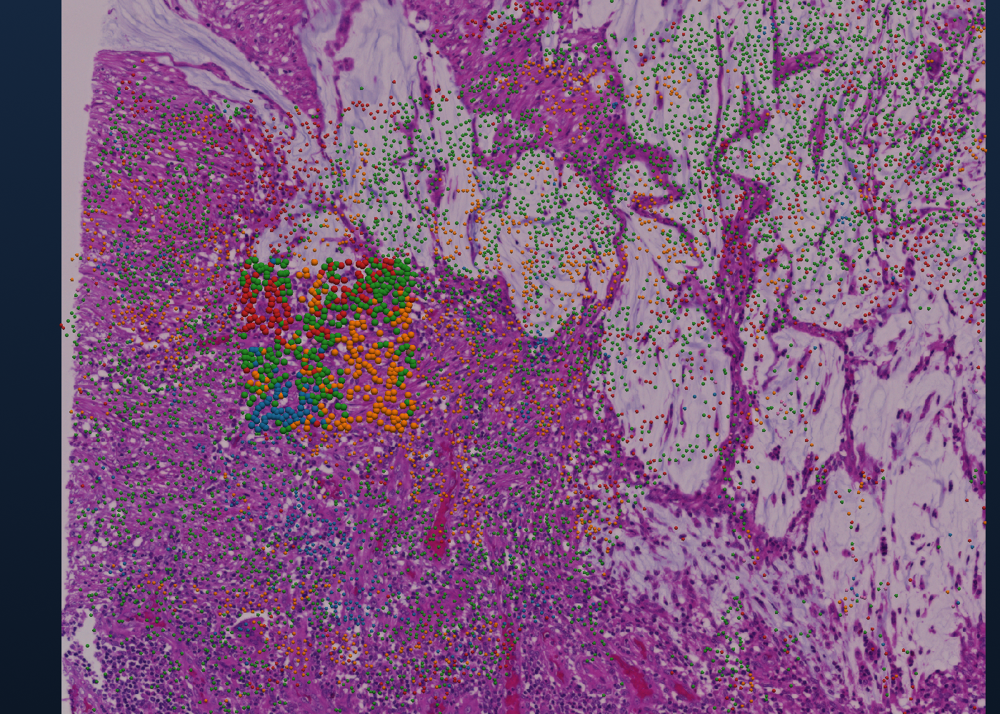

In [8]:
# Cella 6a — coord unificate + crop H&E + frame statico di verifica allineamento
import zarr, numpy as np, pyvista as pv, matplotlib.colors as mcolors
from IPython.display import Image as IPyImage

# === trasformazione UNICA: pixel livello-0 -> mondo (pocket all'origine, y-up) ===
ORIGIN = np.array([CX, CY]); SCALE = 5.0/(SIDE/2)
def to_world(xy):
    w = (np.asarray(xy,float)-ORIGIN)*SCALE; w=w.copy(); w[:,1]*=-1; return w
WXY = to_world(pos)        # (9529,2) regione larga
XY  = to_world(P)          # (583,2)  sotto-grafo, ORA coerente con WXY

# === H&E: crop a livello L sul bounding-box delle cellule ===
HE_DIR    = "/group/sottoriva/00-LAB/IMAGES_SCANS/MINERVA/public/he_images_omezarr"
SAMPLE_ID = "U03_011_B1_S1_T2"      # = sample 47
L = 3                                # 0=full res; 3 -> /8, texture nitida e leggera
series = zarr.open_group(f"{HE_DIR}/{SAMPLE_ID}.ome.zarr", mode="r")["0"]
arr = series[str(L)]                 # (1,3,1,Y,X) uint8
f = 2**L
x0,y0 = pos.min(0); x1,y1 = pos.max(0)
xs0,xs1 = int(x0//f), int(np.ceil(x1/f)); ys0,ys1 = int(y0//f), int(np.ceil(y1/f))
crop = np.asarray(arr[0,:,0, ys0:ys1, xs0:xs1]).transpose(1,2,0)   # (h,w,3)
crop = np.flipud(crop)               # allineamento verticale immagine<->cellule
print("crop H&E:", crop.shape, crop.dtype)

# === piano texturizzato in coord mondo (corner del crop) ===
px = np.array([[xs0*f,ys0*f],[xs1*f,ys0*f],[xs0*f,ys1*f],[xs1*f,ys1*f]],float)
wc = to_world(px); wx0,wy0 = wc.min(0); wx1,wy1 = wc.max(0)
plane = pv.Plane(center=((wx0+wx1)/2,(wy0+wy1)/2,-0.05), direction=(0,0,1),
                 i_size=wx1-wx0, j_size=wy1-wy0)
tex = pv.numpy_to_texture(np.ascontiguousarray(crop))

# === nuvola contesto (cellule fuori pocket) + sotto-grafo ===
oth = ~m                              # m = maschera pocket su 'pos' (da Cella 2)
rgb_oth = (np.array([mcolors.to_rgb(COLORS[c]) for c in ct[oth]])*255).astype(np.uint8)
cloud_oth = pv.PolyData(np.hstack([WXY[oth], np.zeros((oth.sum(),1))])); cloud_oth["rgb"]=rgb_oth
rgb   = (np.array([mcolors.to_rgb(COLORS[c]) for c in C])*255).astype(np.uint8)
lines = np.column_stack([np.full(E.shape[1],2,np.int64),E[0],E[1]]).ravel()
pts0  = np.hstack([XY, np.zeros((P.shape[0],1))]).astype(float)
mesh  = pv.PolyData(pts0.copy(), lines=lines); mesh["rgb"]=rgb

# === frame statico TOP-DOWN WIDE: le cellule devono "sedersi" sul loro tessuto ===
wcx,wcy = WXY.mean(0)
pl = pv.Plotter(off_screen=True, window_size=(1400,1000))
pl.set_background("#0c1726", top="#15273F")
pl.add_mesh(plane, texture=tex)
pl.add_mesh(cloud_oth, style="points", render_points_as_spheres=True, point_size=5,
            scalars="rgb", rgb=True, opacity=0.9)
pl.add_mesh(mesh, style="points", render_points_as_spheres=True, point_size=10,
            scalars="rgb", rgb=True, smooth_shading=True)
pl.camera_position = [(wcx,wcy,78.0),(wcx,wcy,0.0),(0,1,0)]
pl.screenshot("he_align_check.png"); pl.close()
display(IPyImage("he_align_check.png"))

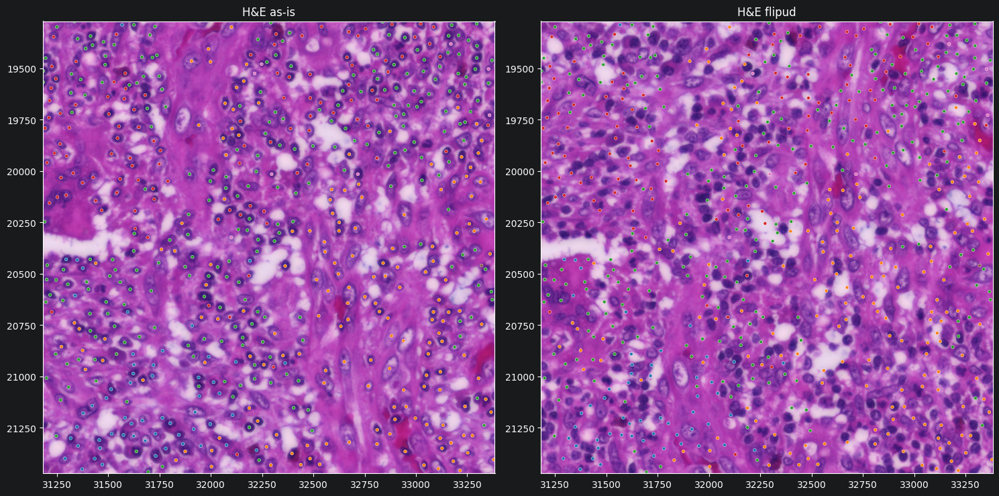

In [9]:
# Cella 6a-check — verifica DECISIVA allineamento nel pocket (2D, pixel-space)
import numpy as np, matplotlib.pyplot as plt, zarr
HE_DIR="/group/sottoriva/00-LAB/IMAGES_SCANS/MINERVA/public/he_images_omezarr"
SAMPLE_ID="U03_011_B1_S1_T2"
Lc=1; fc=2**Lc
series=zarr.open_group(f"{HE_DIR}/{SAMPLE_ID}.ome.zarr",mode="r")["0"]; arrc=series[str(Lc)]

hx=SIDE/2
x0p,x1p,y0p,y1p = CX-hx,CX+hx,CY-hx,CY+hx
xs0,xs1=int(x0p//fc),int(np.ceil(x1p/fc)); ys0,ys1=int(y0p//fc),int(np.ceil(y1p/fc))
he=np.asarray(arrc[0,:,0, ys0:ys1, xs0:xs1]).transpose(1,2,0)
ext0=[xs0*fc, xs1*fc, ys1*fc, ys0*fc]              # [L,R,B,T] (y immagine, giù)
colp=[COLORS[c] for c in C]

fig,(a1,a2)=plt.subplots(1,2,figsize=(15,7.5))
for ax,flip,ttl in [(a1,False,"H&E as-is"),(a2,True,"H&E flipud")]:
    ax.imshow(np.flipud(he) if flip else he, origin="upper", extent=ext0, aspect="equal")
    ax.scatter(P[:,0],P[:,1], c=colp, s=12, edgecolors="white", linewidths=0.3)
    ax.set_xlim(ext0[0],ext0[1]); ax.set_ylim(ext0[2],ext0[3]); ax.set_title(ttl)
plt.tight_layout(); plt.show()

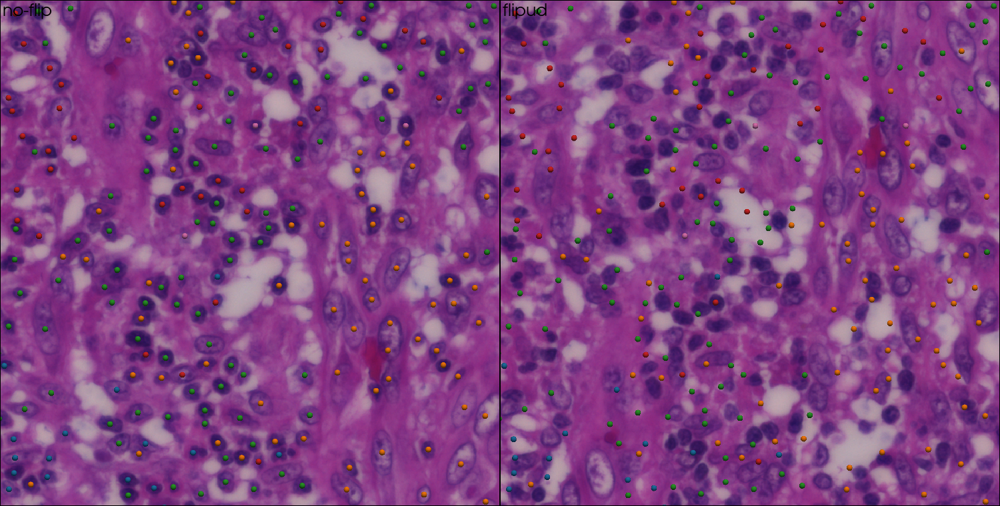

In [10]:
# Cella 6a-fix — quale flip serve alla TEXTURE del piano 3D? (top-down pocket)
import numpy as np, pyvista as pv, matplotlib.colors as mcolors, zarr
from IPython.display import Image as IPyImage

Lc=1; fc=2**Lc
series=zarr.open_group(f"{HE_DIR}/{SAMPLE_ID}.ome.zarr",mode="r")["0"]; arrc=series[str(Lc)]
hx=SIDE/2
xs0,xs1=int((CX-hx)//fc),int(np.ceil((CX+hx)/fc)); ys0,ys1=int((CY-hx)//fc),int(np.ceil((CY+hx)/fc))
he=np.asarray(arrc[0,:,0, ys0:ys1, xs0:xs1]).transpose(1,2,0)

pxc=np.array([[xs0*fc,ys0*fc],[xs1*fc,ys0*fc],[xs0*fc,ys1*fc],[xs1*fc,ys1*fc]],float)
wcc=to_world(pxc); wx0,wy0=wcc.min(0); wx1,wy1=wcc.max(0)
def make_plane():
    return pv.Plane(center=((wx0+wx1)/2,(wy0+wy1)/2,-0.02), direction=(0,0,1),
                    i_size=wx1-wx0, j_size=wy1-wy0)
rgb=(np.array([mcolors.to_rgb(COLORS[c]) for c in C])*255).astype(np.uint8)
nodes=pv.PolyData(np.hstack([XY,np.zeros((P.shape[0],1))])); nodes["rgb"]=rgb

pl=pv.Plotter(off_screen=True, shape=(1,2), window_size=(1500,760))
for col,(flip,ttl) in enumerate([(False,"no-flip"),(True,"flipud")]):
    pl.subplot(0,col); pl.add_text(ttl, font_size=10)
    pl.add_mesh(make_plane(),
                texture=pv.numpy_to_texture(np.ascontiguousarray(np.flipud(he) if flip else he)))
    pl.add_mesh(nodes, style="points", render_points_as_spheres=True, point_size=9,
                scalars="rgb", rgb=True)
    pl.camera_position=[(0,0,12),(0,0,0),(0,1,0)]      # top-down, +y in alto (come il 2D as-is)
pl.screenshot("he_flip_test3d.png"); pl.close()
display(IPyImage("he_flip_test3d.png"))

In [11]:
# Cella 6b — RENDER FINALE: establishing wide -> zoom -> archi -> lift-off+H&E fade -> orbita
import numpy as np, pyvista as pv, networkx as nx, scipy.sparse as sp
import matplotlib.colors as mcolors, zarr, os
from IPython.display import Video

HE_FLIP = False                                   # locked dal test

# === coord unificate ===
ORIGIN=np.array([CX,CY]); SCALE=5.0/(SIDE/2)
def to_world(xy):
    w=(np.asarray(xy,float)-ORIGIN)*SCALE; w=w.copy(); w[:,1]*=-1; return w
WXY=to_world(pos); XY=to_world(P)

# === betweenness -> relief ===
g=nx.Graph(); g.add_nodes_from(range(P.shape[0])); g.add_edges_from(E.T.tolist())
bc=nx.betweenness_centrality(g,normalized=True); bc=np.array([bc[i] for i in range(P.shape[0])]); bc/=bc.max()
A=sp.coo_matrix((np.ones(E.shape[1]*2),(np.r_[E[0],E[1]],np.r_[E[1],E[0]])),shape=(P.shape[0],)*2).tocsr()
deg=np.asarray(A.sum(1)).ravel(); deg[deg==0]=1
zf=bc.copy()
for _ in range(2): zf=0.5*zf+0.5*(A@zf)/deg
zf=((zf-zf.min())/(zf.max()-zf.min()+1e-9))**0.7
Z_MAX,BASE_LIFT=3.2,1.0; zfull=BASE_LIFT+zf*Z_MAX

# === piano H&E (wide, livello 3, no-flip) ===
L=3; f=2**L
series=zarr.open_group(f"{HE_DIR}/{SAMPLE_ID}.ome.zarr",mode="r")["0"]; arr=series[str(L)]
x0,y0=pos.min(0); x1,y1=pos.max(0)
xs0,xs1=int(x0//f),int(np.ceil(x1/f)); ys0,ys1=int(y0//f),int(np.ceil(y1/f))
crop=np.asarray(arr[0,:,0,ys0:ys1,xs0:xs1]).transpose(1,2,0)
if HE_FLIP: crop=np.flipud(crop)
pxc=np.array([[xs0*f,ys0*f],[xs1*f,ys0*f],[xs0*f,ys1*f],[xs1*f,ys1*f]],float)
wc=to_world(pxc); wx0,wy0=wc.min(0); wx1,wy1=wc.max(0)
plane=pv.Plane(center=((wx0+wx1)/2,(wy0+wy1)/2,-0.05),direction=(0,0,1),i_size=wx1-wx0,j_size=wy1-wy0)
tex=pv.numpy_to_texture(np.ascontiguousarray(crop))

# === nuvola contesto + mesh (nodi+archi) ===
oth=~m
rgb_oth=(np.array([mcolors.to_rgb(COLORS[c]) for c in ct[oth]])*255).astype(np.uint8)
cloud=pv.PolyData(np.hstack([WXY[oth],np.zeros((oth.sum(),1))])); cloud["rgb"]=rgb_oth
rgb=(np.array([mcolors.to_rgb(COLORS[c]) for c in C])*255).astype(np.uint8)
lines=np.column_stack([np.full(E.shape[1],2,np.int64),E[0],E[1]]).ravel()
mesh=pv.PolyData(np.hstack([XY,np.zeros((P.shape[0],1))]),lines=lines); mesh["rgb"]=rgb

# === camera ===
def cam(az,elev,r,fz):
    a,e=np.radians(az),np.radians(elev)
    return [(r*np.cos(e)*np.cos(a),r*np.cos(e)*np.sin(a),fz+r*np.sin(e)),(0,0,fz),(0,0,1)]
def lerp_cam(c0,c1,t): return [tuple((1-t)*np.array(a)+t*np.array(b)) for a,b in zip(c0,c1)]
def smooth(t): t=np.clip(t,0,1); return t*t*(3-2*t)
wcx,wcy=WXY.mean(0); R_WIDE=(np.ptp(WXY,axis=0).max()/2)/np.tan(np.radians(15))*1.15
CAM_WIDE=[(wcx,wcy,R_WIDE),(wcx,wcy,0.0),(0.0,1.0,0.0)]
elev,r_orb,az0=33.0,15.0,-25.0; fz=zfull.mean()*0.55; CAM_OBL=cam(az0,elev,r_orb,fz)

# === plotter + attori ===
BG_BOT,BG_TOP="#0c1726","#15273F"; EOP,WIDE_OP=0.30,0.7; OUT="hero3d_final.mp4"; FPS=30
pl=pv.Plotter(off_screen=True,window_size=(1920,1080)); pl.set_background(BG_BOT,top=BG_TOP)
try: pl.enable_anti_aliasing("ssaa")
except Exception as e: print("AA off:",e)
plane_a=pl.add_mesh(plane,texture=tex,opacity=1.0)
cloud_a=pl.add_mesh(cloud,style="points",render_points_as_spheres=True,point_size=5,scalars="rgb",rgb=True,opacity=WIDE_OP)
edge_a =pl.add_mesh(mesh,style="wireframe",color="#8fa6c8",line_width=1.1,opacity=0.0)
node_a =pl.add_mesh(mesh,style="points",render_points_as_spheres=True,point_size=6,scalars="rgb",rgb=True,smooth_shading=True)
pl.open_movie(OUT,framerate=FPS,quality=9)
def zset(z): mesh.points=np.hstack([XY,np.asarray(z,float)[:,None]])
zset(np.zeros(P.shape[0]))

for _ in range(24):                                   # 0 establishing
    pl.camera_position=CAM_WIDE; pl.write_frame()
for i in range(54):                                   # 1 zoom
    t=smooth(i/53)
    pl.camera_position=lerp_cam(CAM_WIDE,CAM_OBL,t)
    cloud_a.prop.opacity=WIDE_OP*(1-t); node_a.prop.point_size=6+10*t; pl.write_frame()
cloud_a.prop.opacity=0.0; node_a.prop.point_size=16
for i in range(30):                                   # 2 archi
    edge_a.prop.opacity=EOP*smooth(i/29); pl.camera_position=CAM_OBL; pl.write_frame()
edge_a.prop.opacity=EOP
for i in range(60):                                   # 3 lift-off + H&E fade
    t=smooth(i/59); zset(t*zfull); plane_a.prop.opacity=1-t
    pl.camera_position=cam(az0+12*t,elev,r_orb,fz); pl.write_frame()
plane_a.prop.opacity=0.0; zset(zfull)
for i in range(150):                                  # 4 orbita
    pl.camera_position=cam((az0+12)+165*(i/149),elev,r_orb,fz); pl.write_frame()

pl.close(); print("FATTO:",OUT,"| MB:",round(os.path.getsize(OUT)/1e6,1))
# Video(OUT,embed=True,width=900)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1920, 1080) to (1920, 1088) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


FATTO: hero3d_final.mp4 | MB: 77.0


In [12]:
# Cella 6b — RENDER FINALE v2: cellule grandi su tessuto -> reveal -> tessuto semi-trasparente -> lift-off (tessuto via, pallini rimpiccioliscono) -> orbita
import numpy as np, pyvista as pv, networkx as nx, scipy.sparse as sp
import matplotlib.colors as mcolors, zarr, os
# from IPython.display import Video

HE_FLIP = False

# === coord unificate ===
ORIGIN=np.array([CX,CY]); SCALE=5.0/(SIDE/2)
def to_world(xy):
    w=(np.asarray(xy,float)-ORIGIN)*SCALE; w=w.copy(); w[:,1]*=-1; return w
WXY=to_world(pos); XY=to_world(P)

# === betweenness -> relief ===
g=nx.Graph(); g.add_nodes_from(range(P.shape[0])); g.add_edges_from(E.T.tolist())
bc=nx.betweenness_centrality(g,normalized=True); bc=np.array([bc[i] for i in range(P.shape[0])]); bc/=bc.max()
A=sp.coo_matrix((np.ones(E.shape[1]*2),(np.r_[E[0],E[1]],np.r_[E[1],E[0]])),shape=(P.shape[0],)*2).tocsr()
deg=np.asarray(A.sum(1)).ravel(); deg[deg==0]=1
zf=bc.copy()
for _ in range(2): zf=0.5*zf+0.5*(A@zf)/deg
zf=((zf-zf.min())/(zf.max()-zf.min()+1e-9))**0.7
Z_MAX,BASE_LIFT=3.2,1.0; zfull=BASE_LIFT+zf*Z_MAX

# === piano H&E (wide, L3, no-flip) ===
L=3; f=2**L
series=zarr.open_group(f"{HE_DIR}/{SAMPLE_ID}.ome.zarr",mode="r")["0"]; arr=series[str(L)]
x0,y0=pos.min(0); x1,y1=pos.max(0)
xs0,xs1=int(x0//f),int(np.ceil(x1/f)); ys0,ys1=int(y0//f),int(np.ceil(y1/f))
crop=np.asarray(arr[0,:,0,ys0:ys1,xs0:xs1]).transpose(1,2,0)
if HE_FLIP: crop=np.flipud(crop)
pxc=np.array([[xs0*f,ys0*f],[xs1*f,ys0*f],[xs0*f,ys1*f],[xs1*f,ys1*f]],float)
wc=to_world(pxc); wx0,wy0=wc.min(0); wx1,wy1=wc.max(0)
plane=pv.Plane(center=((wx0+wx1)/2,(wy0+wy1)/2,-0.05),direction=(0,0,1),i_size=wx1-wx0,j_size=wy1-wy0)
tex=pv.numpy_to_texture(np.ascontiguousarray(crop))

# === nuvola contesto + mesh ===
oth=~m
rgb_oth=(np.array([mcolors.to_rgb(COLORS[c]) for c in ct[oth]])*255).astype(np.uint8)
cloud=pv.PolyData(np.hstack([WXY[oth],np.zeros((oth.sum(),1))])); cloud["rgb"]=rgb_oth
rgb=(np.array([mcolors.to_rgb(COLORS[c]) for c in C])*255).astype(np.uint8)
lines=np.column_stack([np.full(E.shape[1],2,np.int64),E[0],E[1]]).ravel()
mesh=pv.PolyData(np.hstack([XY,np.zeros((P.shape[0],1))]),lines=lines); mesh["rgb"]=rgb

# === camera ===
def cam(az,elev,r,fz):
    a,e=np.radians(az),np.radians(elev)
    return [(r*np.cos(e)*np.cos(a),r*np.cos(e)*np.sin(a),fz+r*np.sin(e)),(0,0,fz),(0,0,1)]
def lerp_cam(c0,c1,t): return [tuple((1-t)*np.array(a)+t*np.array(b)) for a,b in zip(c0,c1)]
def smooth(t): t=np.clip(t,0,1); return t*t*(3-2*t)
wcx,wcy=WXY.mean(0); R_WIDE=(np.ptp(WXY,axis=0).max()/2)/np.tan(np.radians(15))*1.15
CAM_WIDE=[(wcx,wcy,R_WIDE),(wcx,wcy,0.0),(0.0,1.0,0.0)]
elev,r_orb,az0=33.0,15.0,-25.0; fz=zfull.mean()*0.55; CAM_OBL=cam(az0,elev,r_orb,fz)

# === knob dimensioni/opacità (qui si tara!) ===
PT_ESTAB, PT_BIG, PT_NET, CTX_PT = 10, 40, 40, 10   # taglia pallini: su tessuto / pop / rete
TISSUE_DIM = 0.40                                   # trasparenza "leggera" del tessuto
BG_BOT,BG_TOP="#0c1726","#15273F"; EOP,WIDE_OP=0.30,0.85; OUT="hero3d_final.mp4"; FPS=30

pl=pv.Plotter(off_screen=True,window_size=(1920,1080)); pl.set_background(BG_BOT,top=BG_TOP)
try: pl.enable_anti_aliasing("ssaa")
except Exception as e: print("AA off:",e)
plane_a=pl.add_mesh(plane,texture=tex,opacity=1.0)
cloud_a=pl.add_mesh(cloud,style="points",render_points_as_spheres=True,point_size=CTX_PT,scalars="rgb",rgb=True,opacity=WIDE_OP)
edge_a =pl.add_mesh(mesh,style="wireframe",color="#8fa6c8",line_width=1.1,opacity=0.0)
node_a =pl.add_mesh(mesh,style="points",render_points_as_spheres=True,point_size=PT_ESTAB,scalars="rgb",rgb=True,smooth_shading=True)
pl.open_movie(OUT,framerate=FPS,quality=9)
def zset(z): mesh.points=np.hstack([XY,np.asarray(z,float)[:,None]])
zset(np.zeros(P.shape[0]))

# 0 — establishing wide (cellule GRANDI sul tessuto)
node_a.prop.point_size=PT_ESTAB
for _ in range(24): pl.camera_position=CAM_WIDE; pl.write_frame()

# 1 — zoom: contesto svanisce, i pallini del pocket crescono ("appaiono"), tessuto opaco
for i in range(54):
    t=smooth(i/53)
    pl.camera_position=lerp_cam(CAM_WIDE,CAM_OBL,t)
    cloud_a.prop.opacity=WIDE_OP*(1-t)
    node_a.prop.point_size=PT_ESTAB+(PT_BIG-PT_ESTAB)*t
    pl.write_frame()
cloud_a.prop.opacity=0.0; node_a.prop.point_size=PT_BIG

# 2 — reveal: pallini in primo piano -> tessuto LEGGERMENTE trasparente + archi compaiono
for i in range(30):
    t=smooth(i/29)
    plane_a.prop.opacity=1-(1-TISSUE_DIM)*t
    edge_a.prop.opacity=EOP*t
    pl.camera_position=CAM_OBL; pl.write_frame()
plane_a.prop.opacity=TISSUE_DIM; edge_a.prop.opacity=EOP

# 3 — lift-off: tessuto SPARISCE, grafo si alza, pallini RIMPICCIOLISCONO
for i in range(60):
    t=smooth(i/59)
    zset(t*zfull)
    plane_a.prop.opacity=TISSUE_DIM*(1-t)
    node_a.prop.point_size=PT_BIG+(PT_NET-PT_BIG)*t
    pl.camera_position=cam(az0+12*t,elev,r_orb,fz); pl.write_frame()
plane_a.prop.opacity=0.0; node_a.prop.point_size=PT_NET; zset(zfull)

# 4 — orbita
for i in range(150):
    pl.camera_position=cam((az0+12)+165*(i/149),elev,r_orb,fz); pl.write_frame()

pl.close(); print("FATTO:",OUT,"| MB:",round(os.path.getsize(OUT)/1e6,1))
# Video(OUT,embed=True,width=900)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1920, 1080) to (1920, 1088) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


FATTO: hero3d_final.mp4 | MB: 79.9


In [15]:
# Cella 6b — RENDER FINALE v3: apre con solo H&E -> H&E semi-trasparente + pallini appaiono -> zoom -> archi -> lift-off -> orbita
import numpy as np, pyvista as pv, networkx as nx, scipy.sparse as sp
import matplotlib.colors as mcolors, zarr, os
from IPython.display import Video

HE_FLIP = False

# === coord unificate ===
ORIGIN=np.array([CX,CY]); SCALE=5.0/(SIDE/2)
def to_world(xy):
    w=(np.asarray(xy,float)-ORIGIN)*SCALE; w=w.copy(); w[:,1]*=-1; return w
WXY=to_world(pos); XY=to_world(P)

# === betweenness -> relief ===
g=nx.Graph(); g.add_nodes_from(range(P.shape[0])); g.add_edges_from(E.T.tolist())
bc=nx.betweenness_centrality(g,normalized=True); bc=np.array([bc[i] for i in range(P.shape[0])]); bc/=bc.max()
A=sp.coo_matrix((np.ones(E.shape[1]*2),(np.r_[E[0],E[1]],np.r_[E[1],E[0]])),shape=(P.shape[0],)*2).tocsr()
deg=np.asarray(A.sum(1)).ravel(); deg[deg==0]=1
zf=bc.copy()
for _ in range(2): zf=0.5*zf+0.5*(A@zf)/deg
zf=((zf-zf.min())/(zf.max()-zf.min()+1e-9))**0.7
Z_MAX,BASE_LIFT=3.2,1.0; zfull=BASE_LIFT+zf*Z_MAX

# === piano H&E (wide, L3, no-flip) ===
L=3; f=2**L
series=zarr.open_group(f"{HE_DIR}/{SAMPLE_ID}.ome.zarr",mode="r")["0"]; arr=series[str(L)]
x0,y0=pos.min(0); x1,y1=pos.max(0)
xs0,xs1=int(x0//f),int(np.ceil(x1/f)); ys0,ys1=int(y0//f),int(np.ceil(y1/f))
crop=np.asarray(arr[0,:,0,ys0:ys1,xs0:xs1]).transpose(1,2,0)
if HE_FLIP: crop=np.flipud(crop)
pxc=np.array([[xs0*f,ys0*f],[xs1*f,ys0*f],[xs0*f,ys1*f],[xs1*f,ys1*f]],float)
wc=to_world(pxc); wx0,wy0=wc.min(0); wx1,wy1=wc.max(0)
plane=pv.Plane(center=((wx0+wx1)/2,(wy0+wy1)/2,-0.05),direction=(0,0,1),i_size=wx1-wx0,j_size=wy1-wy0)
tex=pv.numpy_to_texture(np.ascontiguousarray(crop))

# === nuvola contesto + mesh ===
oth=~m
rgb_oth=(np.array([mcolors.to_rgb(COLORS[c]) for c in ct[oth]])*255).astype(np.uint8)
cloud=pv.PolyData(np.hstack([WXY[oth],np.zeros((oth.sum(),1))])); cloud["rgb"]=rgb_oth
rgb=(np.array([mcolors.to_rgb(COLORS[c]) for c in C])*255).astype(np.uint8)
lines=np.column_stack([np.full(E.shape[1],2,np.int64),E[0],E[1]]).ravel()
mesh=pv.PolyData(np.hstack([XY,np.zeros((P.shape[0],1))]),lines=lines); mesh["rgb"]=rgb

# === camera ===
def cam(az,elev,r,fz):
    a,e=np.radians(az),np.radians(elev)
    return [(r*np.cos(e)*np.cos(a),r*np.cos(e)*np.sin(a),fz+r*np.sin(e)),(0,0,fz),(0,0,1)]
def lerp_cam(c0,c1,t): return [tuple((1-t)*np.array(a)+t*np.array(b)) for a,b in zip(c0,c1)]
def smooth(t): t=np.clip(t,0,1); return t*t*(3-2*t)
wcx,wcy=WXY.mean(0); R_WIDE=(np.ptp(WXY,axis=0).max()/2)/np.tan(np.radians(15))*1.15
CAM_WIDE=[(wcx,wcy,R_WIDE),(wcx,wcy,0.0),(0.0,1.0,0.0)]
elev,r_orb,az0=33.0,15.0,-25.0; fz=zfull.mean()*0.55; CAM_OBL=cam(az0,elev,r_orb,fz)

# === knob (qui si tara) ===
PT_ESTAB, PT_BIG, PT_NET, CTX_PT = 10, 40, 40, 10   # taglia pallini
TISSUE_DIM = 0.55                                   # "un po' trasparente" (poi sparisce)
# BG_BOT,BG_TOP="#0c1726","#15273F"
BG_BOT,BG_TOP="#000000","#000000"
EOP,WIDE_OP=0.50,0.85
OUT="hero3d_final.mp4"
FPS=30

pl=pv.Plotter(off_screen=True,window_size=(1920,1080)); pl.set_background(BG_BOT,top=BG_TOP)
try: pl.enable_anti_aliasing("ssaa")
except Exception as e: print("AA off:",e)
plane_a=pl.add_mesh(plane,texture=tex,opacity=1.0)
cloud_a=pl.add_mesh(cloud,style="points",render_points_as_spheres=True,point_size=CTX_PT,scalars="rgb",rgb=True,opacity=0.0)
edge_a =pl.add_mesh(mesh,style="wireframe",color="#8fa6c8",line_width=2.0,opacity=0.0)
node_a =pl.add_mesh(mesh,style="points",render_points_as_spheres=True,point_size=PT_ESTAB,scalars="rgb",rgb=True,smooth_shading=True,opacity=0.0)
pl.open_movie(OUT,framerate=FPS,quality=9)
def zset(z): mesh.points=np.hstack([XY,np.asarray(z,float)[:,None]])
zset(np.zeros(P.shape[0]))

# A — SOLO H&E (nessun pallino)
for _ in range(24): pl.camera_position=CAM_WIDE; pl.write_frame()

# B — H&E -> semi-trasparente + pallini APPAIONO (dissolvenza), camera ferma wide
for i in range(30):
    t=smooth(i/29)
    plane_a.prop.opacity=1-(1-TISSUE_DIM)*t
    cloud_a.prop.opacity=WIDE_OP*t
    node_a.prop.opacity=t
    pl.camera_position=CAM_WIDE; pl.write_frame()
plane_a.prop.opacity=TISSUE_DIM; cloud_a.prop.opacity=WIDE_OP; node_a.prop.opacity=1.0

# C — zoom nel pocket (contesto svanisce, nodi crescono), tessuto resta semi-trasparente
for i in range(54):
    t=smooth(i/53)
    pl.camera_position=lerp_cam(CAM_WIDE,CAM_OBL,t)
    cloud_a.prop.opacity=WIDE_OP*(1-t)
    node_a.prop.point_size=PT_ESTAB+(PT_BIG-PT_ESTAB)*t
    pl.write_frame()
cloud_a.prop.opacity=0.0; node_a.prop.point_size=PT_BIG

# D — archi compaiono
for i in range(24):
    edge_a.prop.opacity=EOP*smooth(i/23); pl.camera_position=CAM_OBL; pl.write_frame()
edge_a.prop.opacity=EOP

# E — lift-off: tessuto SPARISCE, grafo si alza, nodi -> PT_NET
for i in range(60):
    t=smooth(i/59)
    zset(t*zfull)
    plane_a.prop.opacity=TISSUE_DIM*(1-t)
    node_a.prop.point_size=PT_BIG+(PT_NET-PT_BIG)*t
    pl.camera_position=cam(az0+12*t,elev,r_orb,fz); pl.write_frame()
plane_a.prop.opacity=0.0; node_a.prop.point_size=PT_NET; zset(zfull)

# F — orbita
for i in range(150):
    pl.camera_position=cam((az0+12)+165*(i/149),elev,r_orb,fz); pl.write_frame()

pl.close(); print("FATTO:",OUT,"| MB:",round(os.path.getsize(OUT)/1e6,1))
# Video(OUT,embed=True,width=900)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1920, 1080) to (1920, 1088) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


FATTO: hero3d_final.mp4 | MB: 84.5
